# Loading Dataset <br>
Note: **Please upload your Kaggle API Token for this**

In [1]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
! mkdir ~/.kaggle

In [3]:
! cp kaggle.json ~/.kaggle/

In [4]:
! chmod 600 ~/.kaggle/kaggle.json

In [5]:
! kaggle datasets download -d andradaolteanu/gtzan-dataset-music-genre-classification

100% 1.21G/1.21G [00:09<00:00, 184MB/s]
100% 1.21G/1.21G [00:09<00:00, 142MB/s]


In [6]:
! unzip gtzan-dataset-music-genre-classification

Archive:  gtzan-dataset-music-genre-classification.zip
  inflating: Data/features_30_sec.csv  
  inflating: Data/features_3_sec.csv  
  inflating: Data/genres_original/blues/blues.00000.wav  
  inflating: Data/genres_original/blues/blues.00001.wav  
  inflating: Data/genres_original/blues/blues.00002.wav  
  inflating: Data/genres_original/blues/blues.00003.wav  
  inflating: Data/genres_original/blues/blues.00004.wav  
  inflating: Data/genres_original/blues/blues.00005.wav  
  inflating: Data/genres_original/blues/blues.00006.wav  
  inflating: Data/genres_original/blues/blues.00007.wav  
  inflating: Data/genres_original/blues/blues.00008.wav  
  inflating: Data/genres_original/blues/blues.00009.wav  
  inflating: Data/genres_original/blues/blues.00010.wav  
  inflating: Data/genres_original/blues/blues.00011.wav  
  inflating: Data/genres_original/blues/blues.00012.wav  
  inflating: Data/genres_original/blues/blues.00013.wav  
  inflating: Data/genres_original/blues/blues.00014.wa

# Data

In [7]:
import os
import time
import random
import librosa
import librosa.display
import numpy as np
import seaborn as sns
import IPython.display as ipd
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, accuracy_score
from sklearn.metrics import confusion_matrix, classification_report
seed = 12
np.random.seed(seed)

In [8]:
feature3 = pd.read_csv('/content/Data/features_3_sec.csv')
print(feature3.columns)

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

In [9]:
feature3.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [10]:
print("Shape of the dataset :")
print(feature3.shape)

Shape of the dataset :
(9990, 60)


In [11]:
print("Count of samples in each genre:")
feature3.label.value_counts().reset_index()

Count of samples in each genre:


,index,label
0,blues,1000
1,jazz,1000
2,metal,1000
3,pop,1000
4,reggae,1000
5,disco,999
6,classical,998
7,hiphop,998
8,rock,998
9,country,997


In [12]:
feature30 = pd.read_csv('/content/Data/features_30_sec.csv')
print(feature30.columns)

Index(['filename', 'length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
  

In [13]:
print("Shape of the dataset:")
print(feature30.shape)

Shape of the dataset:
(1000, 60)


In [14]:
print("Count of samples in each genre:")
feature30.label.value_counts().reset_index()

Count of samples in each genre:


,index,label
0,blues,100
1,classical,100
2,country,100
3,disco,100
4,hiphop,100
5,jazz,100
6,metal,100
7,pop,100
8,reggae,100
9,rock,100


Text(0, 0.5, 'BPM')

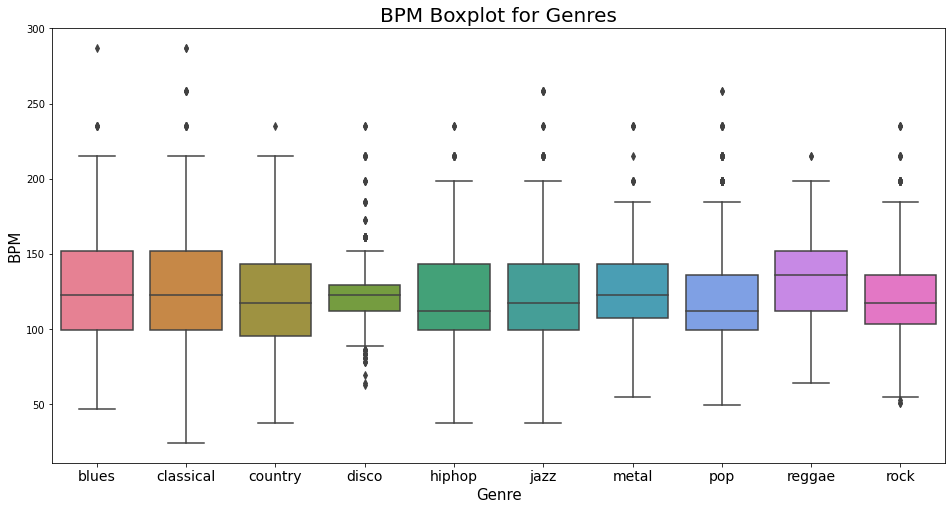

In [15]:
x = feature3[["label", "tempo"]]

fig, ax = plt.subplots(figsize=(16, 8));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 20)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)

# Data Visualization using one audio file

In [16]:
audio_fp = '/content/Data/genres_original/blues/blues.00000.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [17]:
ipd.Audio(audio_data, rate=sr)

In [18]:
print(audio_data.shape)
print(sr)

(661794,)
22050


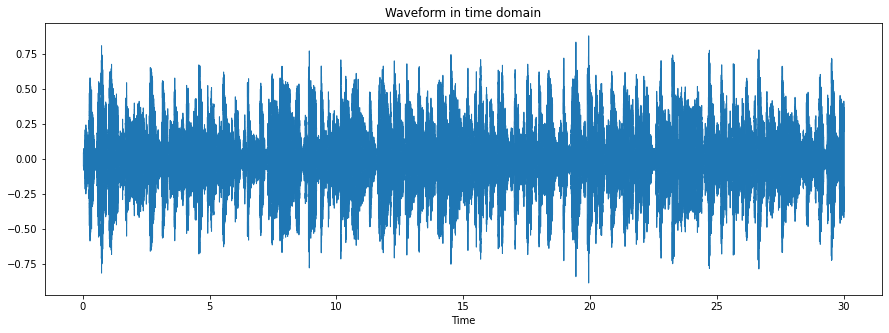

In [19]:
plt.figure(figsize=(15,5))
librosa.display.waveshow(audio_data)
plt.title('Waveform in time domain')
plt.show()

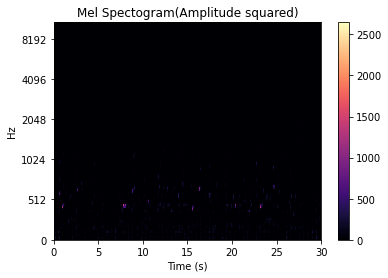

In [20]:
spec = librosa.feature.melspectrogram(y=audio_data, sr=sr)
librosa.display.specshow(spec,y_axis='mel', x_axis='s', sr=sr)
plt.colorbar()
plt.title('Mel Spectogram(Amplitude squared)')
plt.show()

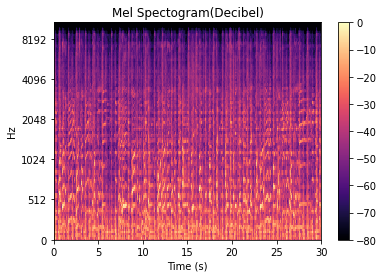

In [21]:
db_spec = librosa.power_to_db(spec, ref=np.max,)
librosa.display.specshow(db_spec,y_axis='mel', x_axis='s', sr=sr)
plt.colorbar()
plt.title('Mel Spectogram(Decibel)')
plt.show()

In [22]:
data_h, data_p = librosa.effects.hpss(audio_data)
spec_h = librosa.feature.melspectrogram(data_h, sr=sr)
spec_p = librosa.feature.melspectrogram(data_p, sr=sr)
db_spec_h = librosa.power_to_db(spec_h,ref=np.max)
db_spec_p = librosa.power_to_db(spec_p,ref=np.max)

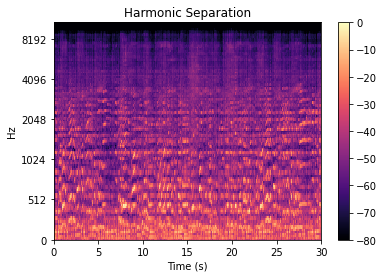

In [23]:
librosa.display.specshow(db_spec_h,y_axis='mel', x_axis='s', sr=sr)
plt.colorbar()
plt.title('Harmonic Separation')
plt.show()

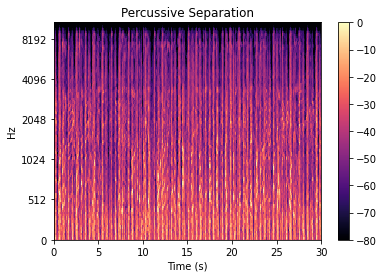

In [24]:
librosa.display.specshow(db_spec_p,y_axis='mel', x_axis='s', sr=sr)
plt.colorbar()
plt.title('Percussive Separation')
plt.show()

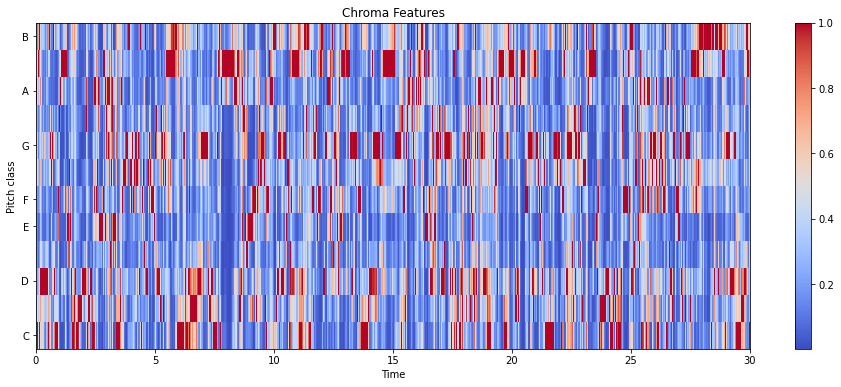

In [25]:
chroma = librosa.feature.chroma_stft(audio_data, sr=sr)
plt.figure(figsize=(16,6))
librosa.display.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma', cmap='coolwarm')
plt.colorbar()
plt.title("Chroma Features")
plt.show()

# Pre-processing data

### Label Encoding

In [26]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
feature3['label']= label_encoder.fit_transform(feature3['label'])
feature3.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,0
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,0
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,0
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,0
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,0


In [27]:
feature3['label'].value_counts()

0    1000
5    1000
6    1000
7    1000
8    1000
3     999
1     998
4     998
9     998
2     997
Name: label, dtype: int64

In [28]:
feature3 = feature3.drop(['filename', 'length'], axis=1)
feature3.head()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,1.080790e+06,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,0
1,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,6.722448e+05,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,0
2,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,7.907127e+05,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,0
3,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,9.216524e+05,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,0
4,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,6.102111e+05,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,0


### Randomizing Samples

In [29]:
df = feature3.sample(frac=1, random_state=seed).reset_index(drop=True)

### Splitting data

In [30]:
X = df.iloc[:, :-1]
Y = df.iloc[:, -1]

In [31]:
X

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,0.443286,0.080448,0.168675,0.000684,3316.813441,7.195313e+05,3065.352449,217024.360365,6970.215032,3.148227e+06,...,0.642526,40.270874,-1.467690,28.548365,0.750436,28.724674,-3.561504,28.170456,-6.276354,26.619930
1,0.525549,0.081804,0.068694,0.002262,1441.469060,3.798195e+05,1873.458852,262633.306791,3256.731333,2.424868e+06,...,2.124204,37.476238,-2.416875,38.039639,0.435442,42.589233,-2.682204,23.545555,-1.145952,22.463905
2,0.326120,0.075380,0.133758,0.000354,1687.721301,1.917811e+05,1966.239849,154894.677891,3588.922401,1.229456e+06,...,-1.635772,23.829321,-0.822906,26.236946,-1.017486,41.636135,-6.719857,45.255863,-3.302364,38.402519
3,0.408677,0.083092,0.114431,0.000489,2254.918223,4.359822e+05,2218.479566,107968.465676,4730.016526,1.409718e+06,...,-1.649191,39.766754,-16.965317,45.699528,2.023049,31.421944,-10.037032,36.359509,-2.615890,29.043436
4,0.210772,0.086844,0.116193,0.002542,1268.081915,7.259242e+04,1535.422488,26242.764173,2555.659931,5.218458e+05,...,-1.011973,19.036591,0.505144,17.527863,-4.957666,20.201040,-3.458240,28.302464,-9.887706,16.908688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,0.416488,0.083587,0.078367,0.000882,2680.179343,2.020851e+05,2295.259702,74944.818241,5195.630634,8.586939e+05,...,-0.463006,50.485477,-4.897184,51.448830,4.378151,36.201321,-5.918340,67.400291,5.867363,160.706757
9986,0.276238,0.085544,0.072763,0.000796,2057.209478,2.753219e+05,2574.512010,79523.588083,4577.627704,1.965761e+06,...,-10.732439,52.819981,-13.220414,120.010574,-14.452634,118.362213,-5.990695,104.605270,-10.275821,178.743118
9987,0.393073,0.091858,0.144680,0.001109,2182.728458,4.808037e+05,2349.140482,211070.848380,4629.969952,2.252115e+06,...,8.041147,47.998882,9.086807,80.292717,7.660681,83.436958,3.784845,60.233944,4.456523,42.883442
9988,0.285811,0.085181,0.089799,0.000410,2141.466643,1.034614e+06,2887.699989,344346.295332,5090.449219,7.604928e+06,...,5.511948,58.935471,5.032537,50.851368,2.498887,42.493412,0.656659,24.070963,-4.225823,44.018368


In [32]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = seed)

In [33]:
print(f"{x_train.shape} {y_train.shape}")
print(f"{x_test.shape} {y_test.shape}")

(7992, 57) (7992,)
(1998, 57) (1998,)


### Scaling data

In [34]:
from sklearn.preprocessing import StandardScaler
scale_X = StandardScaler()
x_train = scale_X.fit_transform(x_train)
x_test = scale_X.transform(x_test)

# K-Nearest Neighbours


### Finding optimal value of k

In [35]:
from sklearn.neighbors import KNeighborsClassifier

errors = []
k_range = range(2, 51)

for k in k_range:
    knn_classifier = KNeighborsClassifier(n_neighbors = k, metric = 'minkowski', p = 2)
    knn_classifier.fit(x_train, y_train)
    pred = knn_classifier.predict(x_test)
    errors.append(mean_squared_error(y_test, pred))

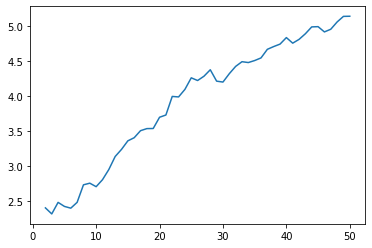

In [36]:
plt.plot(k_range, errors)

In [37]:
k_index = errors.index(min(errors))
K = k_range[k_index]

print(f"Value of optimal k = {K}")

Value of optimal k = 3


### Training the final K-NN model

In [38]:
knn_classifier = KNeighborsClassifier(n_neighbors = k, metric = 'minkowski', p = 2)
knn_classifier.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=50)

### Performance testing

In [39]:
pred = knn_classifier.predict(x_test)

In [40]:
print(confusion_matrix(y_test, pred))

[[135   2  13   5   1   8   9   0  17   2]
 [  0 199   2   0   1   6   0   0   0   1]
 [  6   4 128  18   0   3   1   4   9  10]
 [  2   1   5 153  10   4   0   2  12  12]
 [  5   1   4  15 148   1   4   8  15   3]
 [  1  19  16  10   0 138   0   0   5   2]
 [  1   0   1  25   2   0 148   0   1  21]
 [  1   2   7  15   4   2   0 161   4   2]
 [  4   0  17  18  17   1   2  12 150   3]
 [  3   4  12  35   0   9   7   3   7 117]]


In [41]:
print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.85      0.70      0.77       192
           1       0.86      0.95      0.90       209
           2       0.62      0.70      0.66       183
           3       0.52      0.76      0.62       201
           4       0.81      0.73      0.76       204
           5       0.80      0.72      0.76       191
           6       0.87      0.74      0.80       199
           7       0.85      0.81      0.83       198
           8       0.68      0.67      0.68       224
           9       0.68      0.59      0.63       197

    accuracy                           0.74      1998
   macro avg       0.75      0.74      0.74      1998
weighted avg       0.75      0.74      0.74      1998



In [42]:
pred_train = knn_classifier.predict(x_train)

In [43]:
print(f"Accuracy score on testing data: {accuracy_score(y_test, pred)}")
print(f"Accuracy score on training data: {accuracy_score(y_train, pred_train)}")

Accuracy score on testing data: 0.7392392392392393
Accuracy score on training data: 0.76001001001001


# CNN

In [44]:
from keras.models import Sequential
from keras.layers import Dense, Dropout

In [45]:
def trainModel(model,epochs,optimizer):
  batchsize = 128
  model.compile(optimizer=optimizer,loss='sparse_categorical_crossentropy',metrics='accuracy')
  return model.fit(x_train,y_train,validation_data=(x_test,y_test),epochs=epochs,batch_size=batchsize)

In [46]:
def validate(history):
  print("Validation Accuracy",max(history.history["val_accuracy"]))
  pd.DataFrame(history.history).plot(figsize=(12,6))
  plt.show()

In [47]:
model=Sequential([
    Dense(512,activation='relu',input_shape=(x_train.shape[1],)),
    Dropout(0.2),
    Dense(256,activation='relu'),
    Dropout(0.2),
    Dense(128,activation='relu'),
    Dropout(0.2),
    Dense(64,activation='relu'),
    Dropout(0.2),
    Dense(10,activation='softmax'),
])
print(model.summary())
model_history = trainModel(model=model,epochs=600,optimizer='adam')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               29696     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 64)                8

Validation Accuracy 0.9484484195709229


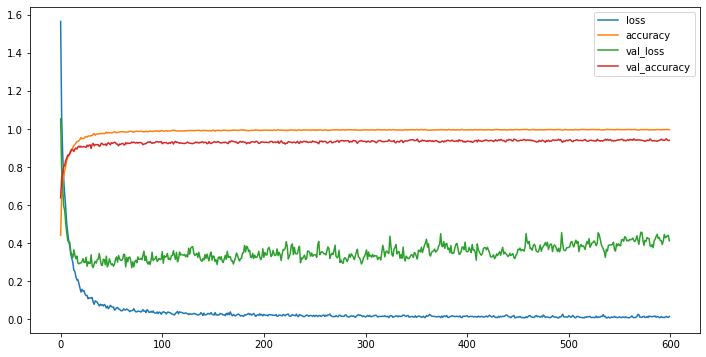

In [48]:
validate(model_history)

In [49]:
test_loss,test_accuracy = model.evaluate(x_test,y_test,batch_size=128)
print("Test Loss is : ",test_loss)
print("Test Accuracy is : ",test_accuracy)

16/16 [==============================] - 0s 2ms/step - loss: 0.4117 - accuracy: 0.9404
Test Loss is :  0.4117201566696167
Test Accuracy is :  0.9404404163360596


# Music Generation

### Gernerating Jazz music using two samples

In [50]:
!pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [51]:
import pydub
from keras.layers import Dense, LSTM, LeakyReLU
from keras.models import Sequential, load_model
from scipy.io.wavfile import read, write

In [52]:
#blues = dataframe[feature3["label"] == "jazz"]

In [53]:
rate, music1 = read('/content/Data/genres_original/jazz/jazz.00000.wav')
rate, music2 = read('/content/Data/genres_original/jazz/jazz.00001.wav')

In [54]:
music1.size

661794

In [55]:
music1 = pd.DataFrame(music1[0:400000])
music2 = pd.DataFrame(music2[0:400000])

In [56]:
music1.head()

,0
0,-303
1,-386
2,-449
3,-434
4,-367


In [57]:
music2.tail()

,0
399995,305
399996,319
399997,326
399998,337
399999,345


In [58]:
# function to create training data by shifting the music data 
def create_train_dataset(df, look_back, train=True):
    dataX1 , dataY1 = [],[]
    for i in range(len(df)-look_back-1):
        dataX1.append(df.iloc[i : i + look_back, 0].values)
        if train:
            dataY1.append(df.iloc[i + look_back, 0])
    if train:
        return np.array(dataX1), np.array(dataY1)
    else:
        return np.array(dataX1)

In [59]:
X1, y1 = create_train_dataset(pd.concat([music1.iloc[0:160000],music2.iloc[0:160000]],axis=0), look_back=3, train=True)

In [60]:
test1 = create_train_dataset(pd.concat([music1.iloc[160001:400000],music2.iloc[160001:400000]], axis=0), look_back=3, train=False)

In [61]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [ ]:
# LSTM Model of the music data
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

In [63]:
# making predictions
pred_rnn1 = rnn1.predict(test1)

15000/15000 [==============================] - 16s 1ms/step


In [64]:
# saving the LSTM predicitons in wav format
write('pred_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [65]:
music1_fp = '/content/Data/genres_original/jazz/jazz.00000.wav'
music1_data, sr = librosa.load(music1_fp)
music1_data, _ = librosa.effects.trim(music1_data)

In [66]:
print("Original Data")

Original Data


In [67]:
ipd.Audio(music1_data, rate=sr)

In [68]:
music2_fp = '/content/Data/genres_original/jazz/jazz.00001.wav'
music2_data, sr = librosa.load(music2_fp)
music2_data, _ = librosa.effects.trim(music2_data)

In [69]:
ipd.Audio(music2_data, rate=sr)

In [70]:
audio_fp = '/content/pred_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [71]:
print("Predicted Data")

Predicted Data


In [72]:
ipd.Audio(audio_data, rate=sr)

### Generating Disco music using two samples

In [194]:
rate, music1 = read('/content/Data/genres_original/disco/disco.00000.wav')
rate, music2 = read('/content/Data/genres_original/disco/disco.00001.wav')

In [195]:
music1 = pd.DataFrame(music1[0:400000])
music2 = pd.DataFrame(music2[0:400000])

In [196]:
def create_train_dataset(df, look_back, train=True):
    dataX1 , dataY1 = [],[]
    for i in range(len(df)-look_back-1):
        dataX1.append(df.iloc[i : i + look_back, 0].values)
        if train:
            dataY1.append(df.iloc[i + look_back, 0])
    if train:
        return np.array(dataX1), np.array(dataY1)
    else:
        return np.array(dataX1)

In [197]:
X1, y1 = create_train_dataset(pd.concat([music1.iloc[0:160000],music2.iloc[0:160000]],axis=0), look_back=3, train=True)

In [198]:
test1 = create_train_dataset(pd.concat([music1.iloc[160001:400000],music2.iloc[160001:400000]], axis=0), look_back=3, train=False)

In [199]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [200]:
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

Epoch 1/20
3200/3200 [==============================] - 10s 3ms/step - loss: 19141604.0000
Epoch 2/20
3200/3200 [==============================] - 9s 3ms/step - loss: 18865346.0000
Epoch 3/20
3200/3200 [==============================] - 9s 3ms/step - loss: 18859728.0000
Epoch 4/20
3200/3200 [==============================] - 9s 3ms/step - loss: 18846090.0000
Epoch 5/20
3200/3200 [==============================] - 9s 3ms/step - loss: 18843878.0000
Epoch 6/20
3200/3200 [==============================] - 10s 3ms/step - loss: 18839248.0000
Epoch 7/20
3200/3200 [==============================] - 9s 3ms/step - loss: 18842824.0000
Epoch 8/20
3200/3200 [==============================] - 9s 3ms/step - loss: 18834406.0000
Epoch 9/20
3200/3200 [==============================] - 10s 3ms/step - loss: 18839904.0000
Epoch 10/20
3200/3200 [==============================] - 9s 3ms/step - loss: 18838836.0000
Epoch 11/20
3200/3200 [==============================] - 10s 3ms/step - loss: 18845698.0000
Epoc

In [201]:
pred_rnn1 = rnn1.predict(test1)

15000/15000 [==============================] - 16s 1ms/step


In [202]:
write('disco_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [212]:
audio_fp = '/content/disco_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [213]:
ipd.Audio(audio_data, rate=sr)

### Generating Blues music using entire dataset

In [73]:
music=[]
count = 0
for filename in os.listdir('/content/Data/genres_original/blues'):
    f = os.path.join('/content/Data/genres_original/blues', filename)
    music.append(read(f)[1])

In [74]:
for i in range(0,100):
  music[i] = pd.DataFrame(music[i][0:400000])

In [75]:
for i in range(0,100):
  df = pd.concat([music[i].iloc[0:160000]],axis=0)
X1, y1 = create_train_dataset(df, look_back=3, train=True)

In [76]:
for i in range(0,100):
  df2 = pd.concat([music[i].iloc[160001:400000]],axis = 0)
test1 = create_train_dataset(df2, look_back=3, train=False)

In [77]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [78]:
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

Epoch 1/20
1600/1600 [==============================] - 6s 3ms/step - loss: 15147134.0000
Epoch 2/20
1600/1600 [==============================] - 5s 3ms/step - loss: 14913440.0000
Epoch 3/20
1600/1600 [==============================] - 5s 3ms/step - loss: 14910255.0000
Epoch 4/20
1600/1600 [==============================] - 5s 3ms/step - loss: 14908178.0000
Epoch 5/20
1600/1600 [==============================] - 4s 3ms/step - loss: 14906559.0000
Epoch 6/20
1600/1600 [==============================] - 4s 3ms/step - loss: 14906528.0000
Epoch 7/20
1600/1600 [==============================] - 4s 3ms/step - loss: 14906077.0000
Epoch 8/20
1600/1600 [==============================] - 6s 4ms/step - loss: 14906218.0000
Epoch 9/20
1600/1600 [==============================] - 5s 3ms/step - loss: 14906159.0000
Epoch 10/20
1600/1600 [==============================] - 5s 3ms/step - loss: 14906095.0000
Epoch 11/20
1600/1600 [==============================] - 5s 3ms/step - loss: 14905263.0000
Epoch 12

In [103]:
pred_rnn1 = rnn1.predict(test1)

7500/7500 [==============================] - 8s 1ms/step


In [ ]:
write('bluespred_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [ ]:
audio_fp = '/content/bluespred_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [104]:
ipd.Audio(audio_data, rate=sr)

### Generating rock music using entire dataset

In [ ]:
music=[]
count = 0
for filename in os.listdir('/content/Data/genres_original/rock'):
    f = os.path.join('/content/Data/genres_original/rock', filename)
    music.append(read(f)[1])

In [ ]:
for i in range(0,100):
  music[i] = pd.DataFrame(music[i][0:400000])

In [ ]:
for i in range(0,100):
  df = pd.concat([music[i].iloc[0:160000]],axis=0)
X1, y1 = create_train_dataset(df, look_back=3, train=True)

In [ ]:
for i in range(0,100):
  df2 = pd.concat([music[i].iloc[160001:400000]],axis = 0)
test1 = create_train_dataset(df2, look_back=3, train=False)

In [ ]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [88]:
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

Epoch 1/20
1600/1600 [==============================] - 6s 3ms/step - loss: 8114330.5000
Epoch 2/20
1600/1600 [==============================] - 4s 3ms/step - loss: 7889103.0000
Epoch 3/20
1600/1600 [==============================] - 5s 3ms/step - loss: 7883408.0000
Epoch 4/20
1600/1600 [==============================] - 4s 3ms/step - loss: 7882725.5000
Epoch 5/20
1600/1600 [==============================] - 5s 3ms/step - loss: 7876431.5000
Epoch 6/20
1600/1600 [==============================] - 5s 3ms/step - loss: 7876629.5000
Epoch 7/20
1600/1600 [==============================] - 4s 3ms/step - loss: 7875362.5000
Epoch 8/20
1600/1600 [==============================] - 5s 3ms/step - loss: 7875756.5000
Epoch 9/20
1600/1600 [==============================] - 5s 3ms/step - loss: 7874239.0000
Epoch 10/20
1600/1600 [==============================] - 5s 3ms/step - loss: 7870718.0000
Epoch 11/20
1600/1600 [==============================] - 4s 3ms/step - loss: 7868834.0000
Epoch 12/20
1600/16

In [89]:
pred_rnn1 = rnn1.predict(test1)

7500/7500 [==============================] - 8s 1ms/step


In [90]:
write('rockpred_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [91]:
audio_fp = '/content/rockpred_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [105]:
ipd.Audio(audio_data, rate=sr)

### Generating Metal music using entire dataset

In [191]:
music=[]
count = 0
for filename in os.listdir('/content/Data/genres_original/metal'):
    f = os.path.join('/content/Data/genres_original/metal', filename)
    music.append(read(f)[1])

In [192]:
for i in range(0,100):
  music[i] = pd.DataFrame(music[i][0:400000])

In [ ]:
for i in range(0,100):
  df = pd.concat([music[i].iloc[0:160000]],axis=0)
X1, y1 = create_train_dataset(df, look_back=3, train=True)

In [ ]:
for i in range(0,100):
  df2 = pd.concat([music[i].iloc[160001:400000]],axis = 0)
test1 = create_train_dataset(df2, look_back=3, train=False)

In [ ]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [121]:
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

Epoch 1/20


ValueError: ignored

In [ ]:
pred_rnn1 = rnn1.predict(test1)

In [ ]:
write('metalpred_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [ ]:
audio_fp = '/content/metalpred_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [ ]:
ipd.Audio(audio_data, rate=sr)

### Generating Hip Hop music using entire dataset

In [122]:
music=[]
count = 0
for filename in os.listdir('/content/Data/genres_original/hiphop'):
    f = os.path.join('/content/Data/genres_original/hiphop', filename)
    music.append(read(f)[1])

In [123]:
for i in range(0,100):
  music[i] = pd.DataFrame(music[i][0:400000])

In [124]:
for i in range(0,100):
  df = pd.concat([music[i].iloc[0:160000]],axis=0)
X1, y1 = create_train_dataset(df, look_back=3, train=True)

In [125]:
for i in range(0,100):
  df2 = pd.concat([music[i].iloc[160001:400000]],axis = 0)
test1 = create_train_dataset(df2, look_back=3, train=False)

In [126]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [127]:
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

Epoch 1/20
1600/1600 [==============================] - 6s 3ms/step - loss: 6389231.0000
Epoch 2/20
1600/1600 [==============================] - 4s 3ms/step - loss: 6278528.5000
Epoch 3/20
1600/1600 [==============================] - 5s 3ms/step - loss: 6273713.5000
Epoch 4/20
1600/1600 [==============================] - 4s 3ms/step - loss: 6272623.0000
Epoch 5/20
1600/1600 [==============================] - 4s 3ms/step - loss: 6270700.0000
Epoch 6/20
1600/1600 [==============================] - 4s 3ms/step - loss: 6269587.0000
Epoch 7/20
1600/1600 [==============================] - 5s 3ms/step - loss: 6270129.5000
Epoch 8/20
1600/1600 [==============================] - 4s 3ms/step - loss: 6268420.5000
Epoch 9/20
1600/1600 [==============================] - 4s 3ms/step - loss: 6269058.5000
Epoch 10/20
1600/1600 [==============================] - 4s 3ms/step - loss: 6269396.5000
Epoch 11/20
1600/1600 [==============================] - 4s 3ms/step - loss: 6268139.5000
Epoch 12/20
1600/16

In [128]:
pred_rnn1 = rnn1.predict(test1)

7500/7500 [==============================] - 8s 1ms/step


In [129]:
write('hiphoppred_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [130]:
audio_fp = '/content/hiphoppred_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [131]:
ipd.Audio(audio_data, rate=sr)

### Generating Reggae music using entire dataset

In [132]:
music=[]
count = 0
for filename in os.listdir('/content/Data/genres_original/reggae'):
    f = os.path.join('/content/Data/genres_original/reggae', filename)
    music.append(read(f)[1])

In [133]:
for i in range(0,100):
  music[i] = pd.DataFrame(music[i][0:400000])

In [134]:
for i in range(0,100):
  df = pd.concat([music[i].iloc[0:160000]],axis=0)
X1, y1 = create_train_dataset(df, look_back=3, train=True)

In [135]:
for i in range(0,100):
  df2 = pd.concat([music[i].iloc[160001:400000]],axis = 0)
test1 = create_train_dataset(df2, look_back=3, train=False)

In [136]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [ ]:
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

In [138]:
pred_rnn1 = rnn1.predict(test1)

7500/7500 [==============================] - 8s 1ms/step


In [139]:
write('reggaepred_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [140]:
audio_fp = '/content/reggaepred_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [141]:
ipd.Audio(audio_data, rate=sr)

### Generating Disco music from the entire dataset

In [152]:
music=[]
count = 0
for filename in os.listdir('/content/Data/genres_original/disco'):
    f = os.path.join('/content/Data/genres_original/disco', filename)
    music.append(read(f)[1])

In [153]:
for i in range(0,100):
  music[i] = pd.DataFrame(music[i][0:400000])

In [154]:
for i in range(0,100):
  df = pd.concat([music[i].iloc[0:160000]],axis=0)
X1, y1 = create_train_dataset(df, look_back=3, train=True)

In [155]:
for i in range(0,100):
  df2 = pd.concat([music[i].iloc[160001:400000]],axis = 0)
test1 = create_train_dataset(df2, look_back=3, train=False)

In [156]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [ ]:
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

In [158]:
pred_rnn1 = rnn1.predict(test1)

7500/7500 [==============================] - 8s 1ms/step


In [159]:
write('discoepred_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [160]:
audio_fp = '/content/discoepred_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [161]:
ipd.Audio(audio_data, rate=sr)

### Generating Country Music using entire dataset

In [173]:
music=[]
count = 0
for filename in os.listdir('/content/Data/genres_original/country'):
    f = os.path.join('/content/Data/genres_original/country', filename)
    music.append(read(f)[1])

In [174]:
for i in range(0,100):
  music[i] = pd.DataFrame(music[i][0:400000])

In [175]:
for i in range(0,100):
  df = pd.concat([music[i].iloc[0:160000]],axis=0)
X1, y1 = create_train_dataset(df, look_back=3, train=True)

In [182]:
df

,0
0,3184
1,-2708
2,-6154
3,-3224
4,4113
...,...
159995,-15506
159996,-14138
159997,-14198
159998,-11081


In [176]:
for i in range(0,100):
  df2 = pd.concat([music[i].iloc[160001:400000]],axis = 0)
test1 = create_train_dataset(df2, look_back=3, train=False)

In [177]:
X1 = X1.reshape((-1, 1, 3))
test1 = test1.reshape((-1, 1, 3))

In [178]:
rnn1 = Sequential()
rnn1.add(LSTM(units=100, activation='relu', input_shape=(None, 3)))
rnn1.add(Dense(units=50, activation='relu'))
rnn1.add(Dense(units=25, activation='relu'))
rnn1.add(Dense(units=12, activation='relu'))
rnn1.add(Dense(units=1, activation='relu'))
rnn1.compile(optimizer='adam', loss='mean_squared_error')
rnn1.fit(X1, y1, epochs=20, batch_size=100)

Epoch 1/20
1600/1600 [==============================] - 7s 4ms/step - loss: 45001432.0000
Epoch 2/20
1600/1600 [==============================] - 7s 4ms/step - loss: 44289500.0000
Epoch 3/20
1600/1600 [==============================] - 5s 3ms/step - loss: 44295256.0000
Epoch 4/20
1600/1600 [==============================] - 5s 3ms/step - loss: 44267672.0000
Epoch 5/20
1600/1600 [==============================] - 5s 3ms/step - loss: 44261272.0000
Epoch 6/20
1600/1600 [==============================] - 5s 3ms/step - loss: 44262940.0000
Epoch 7/20
1600/1600 [==============================] - 6s 4ms/step - loss: 44253172.0000
Epoch 8/20
1600/1600 [==============================] - 5s 3ms/step - loss: 44256324.0000
Epoch 9/20
1600/1600 [==============================] - 6s 4ms/step - loss: 44249032.0000
Epoch 10/20
1600/1600 [==============================] - 5s 3ms/step - loss: 44269324.0000
Epoch 11/20
1600/1600 [==============================] - 5s 3ms/step - loss: 44247416.0000
Epoch 12

In [186]:
pred_rnn1 = rnn1.predict(test1)

7500/7500 [==============================] - 8s 1ms/step


In [190]:
write('countryepred_rnn.wav', rate, pd.concat([pd.DataFrame(pred_rnn1.astype('int16'))], axis=1).values)

In [188]:
audio_fp = '/content/countryepred_rnn.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [189]:
ipd.Audio(audio_data, rate=sr)